# Aula 02 — Métodos Baseados em Valores
## Notebook 04 — DQN, melhorias e limitações dos métodos value-based

**Disciplina:** Modelos de Aprendizagem por Reforço  
**Tema:** Aproximação por função, replay buffer, target network, DQN  
**Ambiente:** LunarLander-v3  

> **Dependência adicional:** `pip install "gymnasium[box2d]"` | Linux: `sudo apt-get install swig`

## Informações do notebook

| Item | Detalhe |
|---|---|
| **Aula** | Aula 02 — Métodos Baseados em Valores |
| **Notebook** | 04 — DQN, melhorias e limitações |
| **Seções** | 2.7, 2.8, 2.9 |
| **Tempo de leitura** | 22 min |
| **Tempo de execução (CPU, padrão)** | 5–10 min |
| **Tempo de execução (GPU)** | 2–4 min |
| **Dependência adicional** | `pip install "gymnasium[box2d]"` + swig |
| **Exercícios** | 3 questões de autoavaliação |

### Pré-requisitos

- **Notebooks anteriores:** `03_sarsa_onpolicy.ipynb` — SARSA, on/off-policy.
- **Conceitos:** Q(s,a), ε-greedy, bootstrapping, redes neurais (básico).

### Competências para o Desafio Final

- Implementar DQN com replay buffer e target network em ambiente de estado contínuo.
- Parametrizar o dispositivo de treinamento (CPU/GPU) usando `rl_utils.obter_dispositivo()`.
- Identificar as instabilidades inerentes ao deep RL e as soluções introduzidas pelo DQN.

### Recapitulando

Nos notebooks anteriores, Q(s,a) era armazenado em uma tabela. Isso funciona para o Taxi-v3 (500 estados), mas o **LunarLander-v3** tem estado contínuo com 8 dimensões — `100^8 = 10^16` estados possíveis. Este notebook substitui a tabela por uma rede neural.

In [1]:
import sys, os
sys.path.insert(0, os.path.abspath("../.."))

import rl_utils
rl_utils.info_versoes()
rl_utils.configurar_matplotlib()
rl_utils.definir_seeds(42)
dispositivo = rl_utils.obter_dispositivo(usar_gpu=True)

Biblioteca           Versão
--------------------------------
gymnasium            1.0.0
torch                2.11.0+cu130
numpy                2.4.2
matplotlib           3.10.8
pandas               3.0.1
scikit-learn         1.8.0
Dispositivo em uso: cuda


## Bloco 1 — Contexto e pergunta


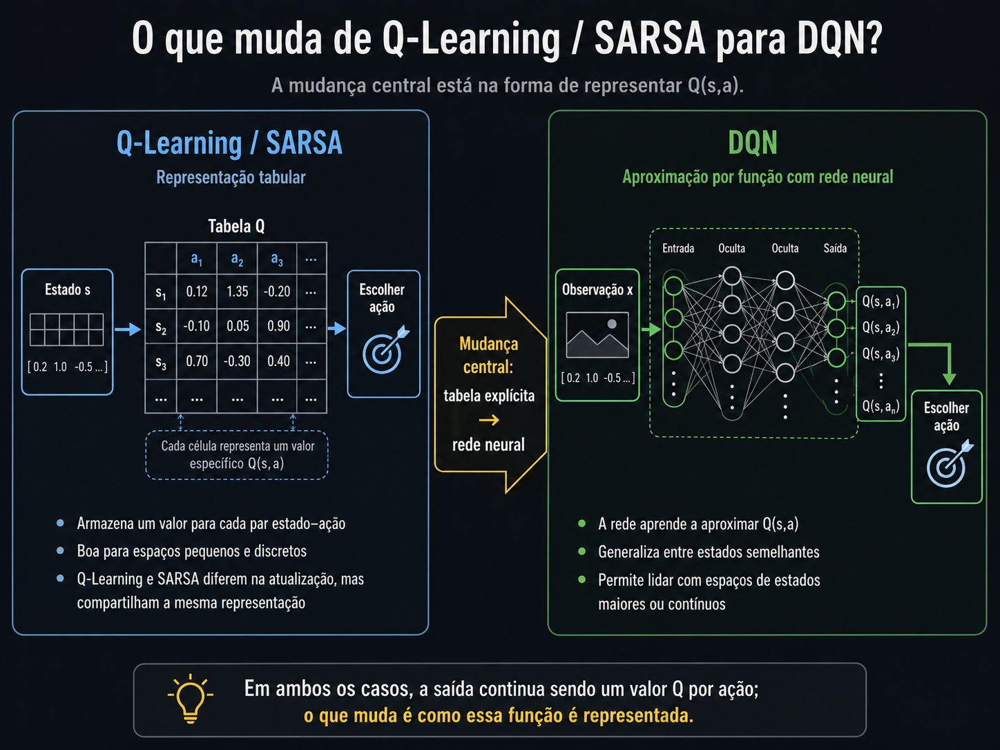


Nos notebooks anteriores, todos os métodos armazenavam Q(s,a) em uma tabela. Isso funciona quando o espaço de estados é discreto e pequeno. No LunarLander-v3, o estado é um vetor contínuo com 8 dimensões (posição, velocidade, ângulo, contato com o solo). Armazenar uma linha da tabela Q para cada estado possível é inviável.

> **Como um agente pode aprender Q(s,a) quando o espaço de estados é contínuo?**

A resposta: substituir a tabela por uma **função aproximadora** — uma rede neural que recebe o vetor de estado e produz um valor Q para cada ação possível. Essa é a ideia central do **Deep Q-Network (DQN)**.

Essa substituição resolve o problema de escala, mas cria uma complicação nova: a combinação de rede neural (aproximação por função) + bootstrapping + aprendizado off-policy pode tornar o treinamento instável — fenômeno conhecido como **tríade mortal** (*deadly triad*). A maior parte deste notebook mostra como o DQN foi projetado para contornar essa instabilidade com dois mecanismos: replay buffer e target network.

**Mensagem principal:**
> *Quando o espaço de estados explode, substituímos a tabela por uma rede neural — mas isso exige salvaguardas para manter o treinamento estável.*

In [2]:
try:
    import Box2D  # noqa: F401
    print("gymnasium[box2d] disponível — LunarLander habilitado.")
except ImportError:
    print("gymnasium[box2d] não encontrado.")
    print()
    print("Para habilitar o treinamento completo, execute:")
    print("  Linux:   sudo apt-get install swig")
    print('           pip install "gymnasium[box2d]"')
    print("  Mac/Win: pip install swig")
    print('           pip install "gymnasium[box2d]"')
    print()
    print("Sem Box2D: células de arquitetura (QNetwork, ReplayBuffer) e teoria")
    print("rodam normalmente. Células de treinamento são ignoradas automaticamente.")

gymnasium[box2d] disponível — LunarLander habilitado.


In [3]:
import random
from collections import deque, namedtuple
import numpy as np
import matplotlib.pyplot as plt
import gymnasium as gym
import torch
import torch.nn as nn
import torch.optim as optim

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)


dispositivo = torch.device("cpu") if not torch.cuda.is_available() else torch.device("cuda")

print("Versões utilizadas:")
print("numpy:", np.__version__)
print("gymnasium:", gym.__version__)
print("torch:", torch.__version__)
print("matplotlib:", plt.matplotlib.__version__)
print("Dispositivo:", dispositivo)

Versões utilizadas:
numpy: 2.4.2
gymnasium: 1.0.0
torch: 2.11.0+cu130
matplotlib: 3.10.8
Dispositivo: cuda


## Inspeção do ambiente

O LunarLander-v3 tem espaço de observações contínuo (Box) e espaço de ações discreto. O estado é um vetor com 8 variáveis: coordenadas x e y, velocidades, ângulo, velocidade angular e contato dos dois pés com o solo. Essa dimensionalidade contínua é o que torna a tabela Q impraticável.

In [4]:
try:
    env = gym.make("LunarLander-v3")
    obs, info = env.reset(seed=SEED)
    LUNARLANDER_DISPONIVEL = True

    print("Espaço de observações:", env.observation_space)
    print("Dimensão do estado:", env.observation_space.shape[0])
    print("Espaço de ações:", env.action_space)
    print("Número de ações:", env.action_space.n)
    print("\nObservação inicial (vetor contínuo de 8 dimensões):")
    print(obs)

    nomes_acoes = {0: "Nenhum motor", 1: "Motor esquerdo",
                   2: "Motor principal", 3: "Motor direito"}
    print("\nAções:")
    for idx, nome in nomes_acoes.items():
        print(f"  {idx}: {nome}")

except Exception as e:
    LUNARLANDER_DISPONIVEL = False
    print(f"LunarLander-v3 não disponível: {type(e).__name__}: {e}")
    print()
    print("Para habilitar o treinamento completo, instale:")
    print("  sudo apt-get install swig")
    print('  pip install "gymnasium[box2d]"')
    print()
    print("As células de arquitetura (QNetwork, ReplayBuffer) rodarão normalmente.")
    print("As células de treinamento serão ignoradas.")

Espaço de observações: Box([ -2.5        -2.5       -10.        -10.         -6.2831855 -10.
  -0.         -0.       ], [ 2.5        2.5       10.        10.         6.2831855 10.
  1.         1.       ], (8,), float32)
Dimensão do estado: 8
Espaço de ações: Discrete(4)
Número de ações: 4

Observação inicial (vetor contínuo de 8 dimensões):
[ 0.00229702  1.4181306   0.2326471   0.3204666  -0.00265488 -0.05269805
  0.          0.        ]

Ações:
  0: Nenhum motor
  1: Motor esquerdo
  2: Motor principal
  3: Motor direito


/home/drl/fiap/rl-ai-scientist/.venv/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists


## Por que a tabela Q não escala



Em ambientes tabulares, cada estado é indexado por um inteiro. No LunarLander, o estado é um vetor contínuo. Mesmo que cada uma das 8 dimensões fosse discretizada em apenas 100 bins, o total de combinações seria 100⁸ = 10¹⁶ estados — completamente intratável. O DQN resolve isso aproximando Q(s,a) com uma função parametrizada.

A frase "100⁸ = 10¹⁶ estados" comunica a inviabilidade pelo tamanho, mas o problema é mais profundo do que apenas memória.
Mesmo que tivéssemos um disco capaz de armazenar 10¹⁶ entradas, a tabela continuaria inútil — e entender por quê é o que motiva a transição para redes neurais.


### Discretizar não resolve, e a razão é estatística, não computacional



A tentação inicial, ao olhar um espaço contínuo, é discretizá-lo em bins e tratar cada combinação como um estado tabular. O problema é que o Q-Learning tabular precisa **visitar cada par estado-ação muitas vezes** para que a estimativa de Q convirja. Com 10¹⁶ estados, mesmo que o agente visitasse mil estados por segundo, levaria mais tempo do que a idade do universo para visitar cada um uma única vez. A tabela não escala não por ocupar memória, mas porque o **tempo de coleta de dados necessário para preencher essas células é fisicamente impossível**.

Mais grave ainda: a tabela trata cada célula como independente. Se o agente aprendeu que, em uma posição (x=1.23, y=4.56) com velocidade tal e ângulo tal, a melhor ação é "acionar motor principal", essa informação **não se transfere** para a posição quase idêntica (x=1.24, y=4.56). São duas células diferentes na tabela, com estimativas de Q completamente desconectadas. Toda a estrutura geométrica do espaço de estados — o fato de que estados próximos tendem a ter valores próximos — é simplesmente ignorada.



### O que a rede neural muda



Quando substituímos a tabela por uma função parametrizada Q(s; θ), o paradigma se inverte. Em vez de armazenar 10¹⁶ valores independentes, armazenamos alguns milhares de pesos θ. A rede aprende uma função suave que mapeia estados em valores, e essa suavidade é exatamente o que estava faltando: estados próximos no espaço contínuo produzem ativações próximas nas camadas internas, e portanto valores Q próximos na saída.

Isso significa que cada experiência observada **informa não apenas o estado visitado, mas toda uma vizinhança no espaço de estados**. O agente aprende, por exemplo, que "estar caindo rápido com o módulo inclinado para a direita é ruim", e essa lição se aplica a infinitas configurações específicas que compartilham essa estrutura. A generalização deixa de ser um luxo e passa a ser o mecanismo central que torna o aprendizado viável.

A contrapartida é que a rede pode generalizar mal, prever valores absurdos para regiões pouco visitadas, ou esquecer o que aprendeu em regiões antigas quando treina em regiões novas (o famoso *catastrophic forgetting*). Esses problemas não existiam no tabular — uma célula só mudava quando era explicitamente atualizada — e passam a fazer parte do escopo do DQN.

In [5]:
if LUNARLANDER_DISPONIVEL:
    dim_estado = env.observation_space.shape[0]
    dim_acoes = env.action_space.n
else:
    # Dimensões reais do LunarLander-v3 (fallback para demonstração da arquitetura)
    dim_estado = 8   # posição x/y, velocidade x/y, ângulo, vel. angular, contato pé esq/dir
    dim_acoes = 4    # nenhum motor, esquerdo, principal, direito

print("Dimensão do estado (contínuo):", dim_estado)
print("Número de ações (discreto):", dim_acoes)
print()
print("Se cada dimensão fosse discretizada em 100 bins:")
print(f"  Número de estados = 100^{dim_estado} = {100**dim_estado:.2e}")
print()
print("DQN: usa rede neural Q(s;θ) → produz um valor Q por ação")

Dimensão do estado (contínuo): 8
Número de ações (discreto): 4

Se cada dimensão fosse discretizada em 100 bins:
  Número de estados = 100^8 = 1.00e+16

DQN: usa rede neural Q(s;θ) → produz um valor Q por ação


## Bloco 2 — Mini teoria: arquitetura do DQN



O DQN resolve três problemas que surgem ao aplicar Q-Learning com redes neurais:

| Problema | Solução |
|---|---|
| Estados contínuos → Q-table impossível | **Rede neural Q(s; θ)** que generaliza entre estados similares |
| Amostras consecutivas correlacionadas → treinamento instável | **Replay buffer** com amostragem aleatória de transições passadas |
| Alvo de atualização muda a cada passo → divergência | **Target network** com pesos fixos por vários episódios |

Os próximos blocos detalham cada componente e mostram como eles trabalham juntos para estabilizar o treinamento.

---

**Descrição dos três componentes:**

1. **Rede neural Q(s; θ):** recebe o vetor de estado e produz um valor Q para cada ação discreta. Estados similares produzem saídas similares — o que permite generalização para estados nunca vistos.

2. **Replay buffer:** armazena transições passadas `(s, a, r, s', done)`. A rede é treinada em *minibatches* amostrados aleatoriamente, quebrando correlações temporais entre amostras consecutivas.

3. **Target network:** uma cópia da rede Q com pesos fixos por alguns episódios. Usada para calcular o alvo de atualização, estabilizando o treinamento ao evitar que o alvo mude a cada passo.

## Arquitetura da rede neural

**O problema do alvo em movimento**

No Q-Learning tabular, o alvo de atualização é:

    alvo = r + γ · max_a' Q(s', a')

Em uma rede neural, os pesos são compartilhados entre todos os estados. Quando a rede atualiza para melhorar Q(s,a), os valores Q(s', a') também mudam — porque usam os mesmos pesos. O alvo se move a cada passo de treinamento: é como tentar acertar um alvo que anda enquanto você mira.

**A solução — rede alvo (*target network*):**

| Rede | Papel | Quando atualiza |
|---|---|---|
| `rede_online` (principal) | Estima Q(s,a) para o estado atual | A cada passo de otimização |
| `rede_alvo` | Calcula alvos `r + γ·max Q(s', a')` com pesos fixos | Sincroniza a cada N episódios |

Os pesos da `rede_alvo` ficam congelados por vários episódios, garantindo alvos estáveis. Periodicamente, copiamos: `rede_alvo ← rede_online`. Esse intervalo é controlado pelo hiperparâmetro `ATUALIZAR_ALVO_A_CADA`.

Há uma escolha de design no DQN que costuma passar despercebida, mas que tem consequências importantes: a rede recebe **apenas o estado** e produz **um Q para cada ação possível**, em vez de receber o par (estado, ação) e produzir um único valor escalar.

### Duas arquiteturas possíveis



**Arquitetura A (par estado-ação como entrada):**
A rede recebe a concatenação de s e a, e produz um único Q(s, a) na saída. Para escolher a melhor ação, seria necessário fazer uma passagem direta para cada ação possível e comparar os resultados.

**Arquitetura B (estado como entrada, ação como índice de saída):**
A rede recebe apenas o estado s, e produz um vetor de saída com uma posição para cada ação. Q(s, a₀), Q(s, a₁), Q(s, a₂), Q(s, a₃) saem todos juntos em uma única passagem direta.

O DQN usa a arquitetura B, e a razão é puramente prática: o operador `max_a Q(s, a)`, central no alvo, exige avaliar todas as ações em todo passo. Com a arquitetura B, isso custa uma única passagem direta. Com a arquitetura A, custaria uma passagem por ação — quatro vezes mais caro no LunarLander, e impraticável em ambientes com muitas ações.

### Por que isso só funciona para ações discretas


A arquitetura B só faz sentido quando o número de ações é pequeno e fixo: cada ação tem seu próprio neurônio de saída. Para ações contínuas (digamos, "acionar motor com intensidade entre 0 e 1"), não há como ter um neurônio por ação, pois há infinitas. É por isso que o DQN não se generaliza diretamente para ações contínuas — algoritmos como DDPG, SAC e PPO precisam de arquiteturas fundamentalmente diferentes, geralmente com uma rede separada (ator) que produz a ação diretamente.

### Target network


O problema do alvo em movimento é talvez o conceito mais sutil do DQN, porque ele só faz sentido quando se entende exatamente o que muda ao trocar a tabela pela rede.

#### Por que o alvo é estático no tabular e móvel na rede

No Q-Learning tabular, o alvo é `r + γ · max Q(s', a')`. Quando atualizamos a célula Q[s, a], modificamos **apenas** essa célula — Q(s', a') permanece intacto. O alvo da próxima iteração, calculado a partir de Q(s', ·), continuará exatamente o mesmo (a menos que outra atualização passe por ali). As células são independentes.

Na rede neural, todos os Q(s, a) são calculados pelos **mesmos pesos θ**. Quando damos um passo de gradiente para empurrar Q(s, a; θ) na direção do alvo, modificamos θ. E como Q(s', a'; θ) usa os mesmos θ, ele também muda. O alvo que era `r + γ · max Q(s', a'; θ)` antes da atualização deixa de ser o alvo logo depois — porque os θ que o definem acabaram de mudar.

Essa é a metáfora do "alvo que se move enquanto você mira": cada passo de treino desloca simultaneamente a previsão e o alvo. Em casos extremos, isso leva a divergência: a rede persegue um alvo que foge na mesma direção, e os valores de Q crescem sem limite.

#### Por que congelar resolve



A solução do DQN é simples e brutal: criar uma cópia da rede, chamada `rede_alvo`, e usar **ela** para calcular o alvo. Os pesos da `rede_alvo` ficam congelados por vários episódios; durante esse intervalo, o alvo é completamente estático do ponto de vista do otimizador. A rede online treina contra um alvo fixo, exatamente como um problema de regressão supervisionada padrão, e os passos de gradiente se tornam estáveis.

Periodicamente — a cada `ATUALIZAR_ALVO_A_CADA` episódios —, copiamos os pesos: `rede_alvo ← rede_online`. O alvo "salta" para uma nova posição, refletindo o que a rede online aprendeu nesse intervalo, e o ciclo recomeça. É um aprendizado em duas escalas de tempo: a rede online ajusta-se rapidamente; a rede alvo segue lentamente atrás.

#### O trade-off da frequência de sincronização

A escolha de quão frequente sincronizar é um trade-off explícito:

- **Sincronizar muito raramente** (alvo congelado por muitos episódios): treinamento muito estável, mas o alvo fica defasado em relação ao que a rede online já aprendeu, retardando a propagação de informação. Em casos extremos, a rede online pode chegar a um ponto onde seus próprios valores de Q discordam fortemente do alvo, gerando saltos bruscos quando a sincronização finalmente ocorre.

- **Sincronizar muito frequentemente** (alvo congelado por poucos episódios): aproxima-se do caso sem rede alvo, com o alvo voltando a se mover quase a cada passo. Recupera-se a instabilidade original.

Valores típicos na literatura ficam entre algumas centenas e alguns milhares de passos de gradiente, ajustados empiricamente. Uma alternativa moderna são as **soft updates** (usadas em DDPG e SAC), onde em vez de copiar de uma vez, atualiza-se continuamente: `θ_alvo ← τ · θ_online + (1 − τ) · θ_alvo`, com τ pequeno (tipicamente 0.005). Isso suaviza a transição e elimina os "saltos", ao custo de um hiperparâmetro a mais para ajustar.

### Camadas e dimensões típicas no LunarLander

Para o LunarLander, com `dim_estado = 8` e `dim_acoes = 4`, uma arquitetura padrão seria:

- **Camada de entrada**: 8 neurônios, recebendo o vetor de estado [posição x, posição y, velocidade x, velocidade y, ângulo, velocidade angular, contato pé esquerdo, contato pé direito].
- **Camada oculta 1**: tipicamente 64 ou 128 neurônios, com ativação ReLU.
- **Camada oculta 2**: outra camada de 64 ou 128 neurônios, com ativação ReLU.
- **Camada de saída**: 4 neurônios, **sem função de ativação** (saída linear), produzindo Q(s, a₀) ... Q(s, a₃).



Dois detalhes merecem comentário. Primeiro, a saída é linear porque os valores de Q podem ser positivos ou negativos e não têm um intervalo fechado conhecido — aplicar sigmoid ou tanh limitaria artificialmente o que a rede pode aprender. Segundo, a rede é deliberadamente pequena. Em RL, redes maiores não significam melhor desempenho: aumentam a variância das estimativas, facilitam catastrophic forgetting, e tornam o ajuste de hiperparâmetros mais difícil. A literatura de DQN clássico mostra que duas a três camadas ocultas com algumas dezenas a poucas centenas de neurônios costumam ser suficientes para problemas de baixa dimensão como o LunarLander.

Para problemas com observações em pixels (como Atari), a arquitetura ganha camadas convolucionais antes das camadas densas, mas a estrutura geral é a mesma: o estado entra, uma cabeça densa produz um Q por ação na saída.

In [6]:
class RedeQ(nn.Module):
    """
    Rede neural usada para aproximar a função Q(s, a) no DQN.

    Em vez de armazenar uma tabela Q explícita, como no Q-Learning tabular,
    usamos uma rede neural para receber um estado como entrada e devolver
    um valor Q estimado para cada ação possível.

    Entrada:
        x: representação vetorial do estado atual.

    Saída:
        vetor com dim_saida valores, em que cada posição representa Q(s, a)
        para uma ação discreta do ambiente.
    """

    def __init__(self, dim_entrada, dim_saida, dim_oculta=128):
        super().__init__()

        # dim_entrada:
        # número de variáveis que representam o estado.
        # Por exemplo, no CartPole, o estado pode conter posição, velocidade,
        # ângulo e velocidade angular.
        #
        # dim_saida:
        # número de ações discretas disponíveis no ambiente.
        # A rede produzirá um valor Q para cada uma dessas ações.
        #
        # dim_oculta:
        # tamanho das camadas intermediárias.
        # O valor 128 é uma escolha comum para ambientes simples ou de baixa
        # dimensionalidade, pois oferece capacidade suficiente sem deixar
        # o modelo excessivamente pesado.

        self.rede = nn.Sequential(
            # Primeira camada linear:
            # transforma o vetor de estado em uma representação interna
            # com dim_oculta neurônios.
            nn.Linear(dim_entrada, dim_oculta),

            # ReLU introduz não linearidade.
            # Sem funções de ativação, várias camadas lineares seriam
            # equivalentes a uma única transformação linear.
            nn.ReLU(),

            # Segunda camada oculta:
            # permite que a rede aprenda combinações mais abstratas das
            # características do estado.
            nn.Linear(dim_oculta, dim_oculta),

            # Nova ativação não linear.
            nn.ReLU(),

            # Camada de saída:
            # produz um valor Q para cada ação discreta.
            #
            # Não usamos ativação na saída, porque os valores Q representam
            # estimativas de retorno acumulado e podem assumir valores
            # positivos, negativos ou acima de 1.
            nn.Linear(dim_oculta, dim_saida)
        )

    def forward(self, x):
        """
        Executa a passagem direta da rede.

        Recebe um estado ou um lote de estados e devolve os valores Q
        estimados para todas as ações possíveis.
        """
        return self.rede(x)


# Cria a rede online.
# Esta é a rede principal do DQN: ela será atualizada por gradiente durante
# o treinamento e será usada para estimar Q(s, a) para os estados atuais.
rede_online = RedeQ(dim_estado, dim_acoes).to(dispositivo)


# Cria a rede alvo.
# Ela tem exatamente a mesma arquitetura da rede online, mas não será
# atualizada a cada passo de otimização.
#
# Sua função é fornecer alvos de Bellman mais estáveis, evitando que o
# próprio alvo mude continuamente enquanto a rede online aprende.
rede_alvo = RedeQ(dim_estado, dim_acoes).to(dispositivo)


# Inicializa a rede alvo com os mesmos pesos da rede online.
# No início do treinamento, as duas redes partem exatamente do mesmo ponto.
#
# Depois disso, apenas a rede_online será treinada diretamente.
# A rede_alvo será sincronizada periodicamente com a rede_online.
rede_alvo.load_state_dict(rede_online.state_dict())


# Coloca a rede alvo em modo de avaliação.
#
# Isso é importante para camadas que se comportam de forma diferente em treino
# e inferência, como Dropout e BatchNorm. Neste caso específico, a arquitetura
# usa apenas Linear e ReLU, então o efeito prático é pequeno, mas a chamada
# mantém a intenção correta: a rede alvo é usada para inferência estável.
rede_alvo.eval()


# Opcional, mas didaticamente recomendável:
# garante que os parâmetros da rede alvo não serão atualizados por gradiente.
#
# Em muitos códigos de DQN, isso também é controlado simplesmente não passando
# os parâmetros da rede_alvo para o otimizador. Ainda assim, congelar os
# parâmetros deixa explícito que a rede alvo não deve aprender diretamente.
for parametro in rede_alvo.parameters():
    parametro.requires_grad = False


# Exibe a arquitetura da rede online.
# Isso ajuda a conferir se a rede foi montada conforme esperado:
# entrada -> camada oculta -> ReLU -> camada oculta -> ReLU -> saída.
print("Rede Q:")
print(rede_online)


# Conta o número total de parâmetros treináveis da rede online.
#
# p.numel() retorna a quantidade de elementos em cada tensor de parâmetro.
# O filtro p.requires_grad garante que sejam contados apenas os parâmetros
# que serão ajustados durante o treinamento.
num_parametros = sum(
    p.numel()
    for p in rede_online.parameters()
    if p.requires_grad
)

print(f"\nParâmetros treináveis: {num_parametros:,}")

Rede Q:
RedeQ(
  (rede): Sequential(
    (0): Linear(in_features=8, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=4, bias=True)
  )
)

Parâmetros treináveis: 18,180


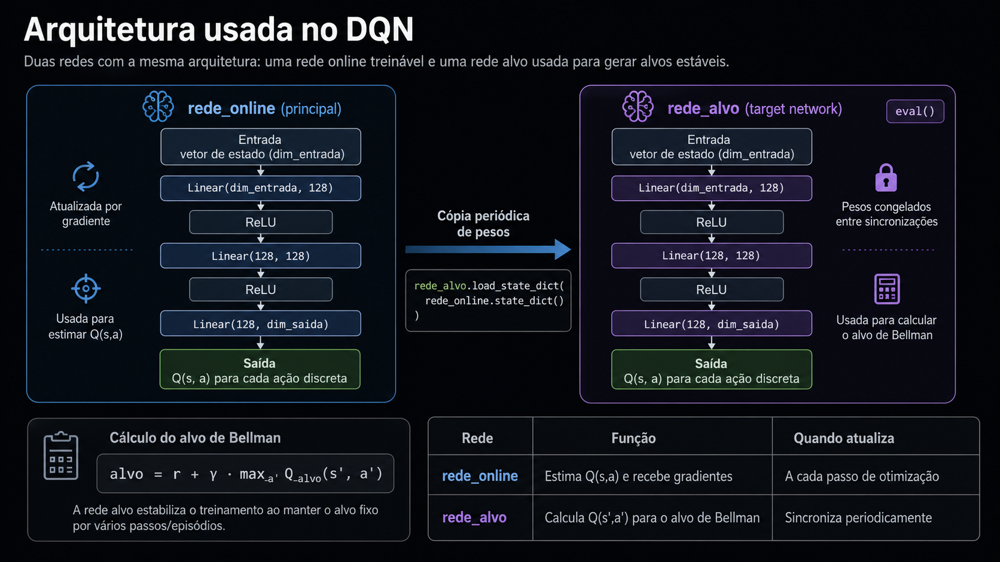


A figura apresenta a arquitetura utilizada para aproximar a função valor-ação \(Q(s,a)\) em um agente DQN. Em vez de armazenar uma tabela com os valores de cada par estado–ação, o modelo recebe o estado do ambiente como entrada e produz, na saída, um valor Q estimado para cada ação discreta disponível.

A rede é composta por duas camadas ocultas com ativação ReLU, responsáveis por transformar a representação do estado em informações mais úteis para a tomada de decisão. A camada final não utiliza função de ativação, pois os valores Q representam estimativas livres de retorno acumulado, podendo assumir diferentes escalas numéricas.

Também são representadas duas redes com a mesma arquitetura: a **rede online** e a **rede alvo**. A rede online é atualizada durante o treinamento, enquanto a rede alvo é mantida temporariamente fixa para calcular alvos de Bellman mais estáveis. Essa separação ajuda a reduzir oscilações e torna o aprendizado do DQN mais robusto.

## Replay buffer

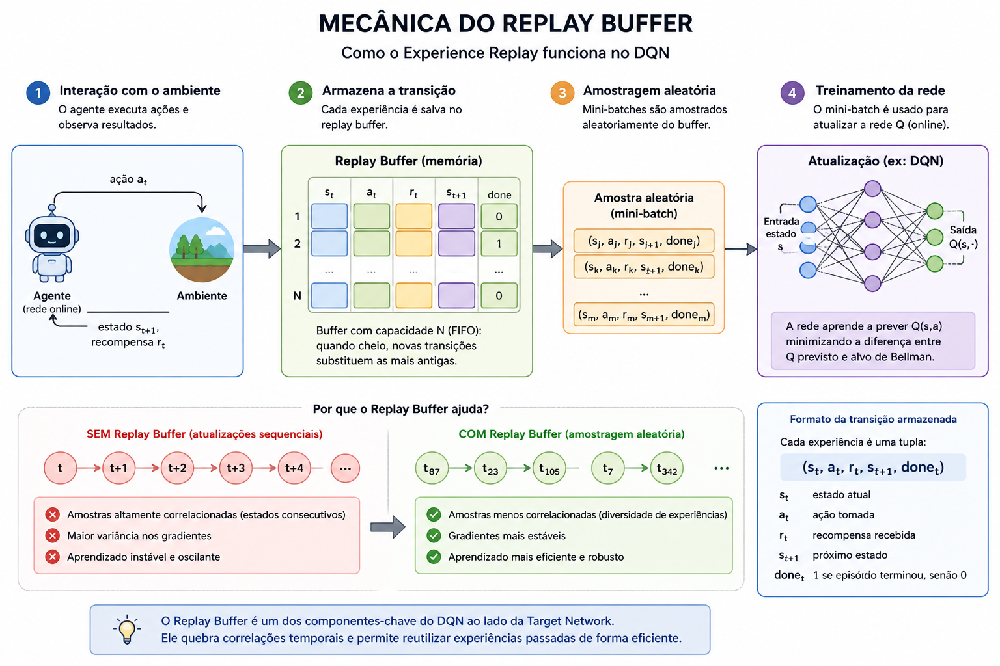

**Por que a ordem das experiências importa?**

Sem um buffer, a rede é treinada com transições na sequência em que ocorrem:

    passo 1: (s₁, a₁, r₁, s₂) → atualização dos pesos
    passo 2: (s₂, a₂, r₂, s₃) → atualização dos pesos
    passo 3: (s₃, a₃, r₃, s₄) → atualização dos pesos

Estados consecutivos são **altamente correlacionados**: s₂ deriva de s₁, s₃ deriva de s₂. Cada atualização tende a desfazer parte da anterior porque os gradientes empurram sempre na mesma direção local. A rede "esquece" estados anteriores rapidamente — um fenômeno chamado ***catastrophic forgetting***.

**A solução — replay buffer:**

Armazenamos até 50.000 transições e **amostramos aleatoriamente** um mini-lote a cada passo de otimização. Cada mini-lote mistura experiências de fases diferentes do treinamento, forçando a rede a manter comportamento consistente para estados variados.

O replay buffer é frequentemente apresentado como "uma memória que guarda transições passadas para amostrar depois", o que está correto mas não explica por que ele é necessário. A motivação real está em duas patologias estatísticas que aparecem quando se treina uma rede neural com dados sequenciais de RL.

### Por que amostras consecutivas são correlacionadas

Imagine o agente jogando LunarLander. Em um episódio típico, ele desce gradualmente, ajustando posição e ângulo. Os estados observados em passos consecutivos são quase idênticos: a posição muda alguns centímetros, o ângulo gira uma fração de grau. Em uma janela de cem passos, todos os estados pertencem a uma mesma região do espaço — digamos, "descida controlada à esquerda do alvo".

Se treinarmos a rede usando essas amostras na ordem em que aparecem, estaremos atualizando os pesos centenas de vezes seguidas com dados de uma mesma região. A rede passa a otimizar fortemente para "descida à esquerda", e quando o agente entra em outra região do espaço — digamos, "queda livre acelerada" —, os pesos já foram tão ajustados para o cenário anterior que a rede esqueceu o que sabia sobre o novo. Esse é o catastrophic forgetting acontecendo em tempo real, induzido pela própria correlação temporal das amostras.

### Por que isso quebra o pressuposto do gradiente descendente


Treinamento de redes neurais via SGD assume implicitamente que cada minibatch é uma amostra **aproximadamente i.i.d.** (independente e identicamente distribuída) da distribuição de dados. Esse pressuposto sustenta a ideia de que a média do gradiente sobre o minibatch aproxima o gradiente verdadeiro da função de perda.

Em RL online sem replay, esse pressuposto é violado de forma grosseira. Amostras consecutivas vêm da mesma trajetória, da mesma política, da mesma região do espaço. O gradiente calculado sobre elas é um estimador enviesado, e o treino pode divergir, oscilar, ou simplesmente convergir para uma solução pobre adaptada apenas à última região visitada.


### Como o buffer reorganiza a estatística



O replay buffer guarda, digamos, as últimas 100 mil transições. Quando é hora de treinar, amostramos um minibatch **aleatoriamente** desse pool. As 64 transições do minibatch provavelmente vêm de 64 episódios diferentes, 64 regiões diferentes do espaço, 64 momentos distintos do treinamento. A correlação temporal é destruída por construção.

Há dois ganhos adicionais que merecem destaque. Primeiro, **reuso de dados**: cada transição custosa de coletar é usada várias vezes ao longo do treino, em minibatches diferentes. Isso melhora drasticamente a eficiência amostral, algo crítico em RL onde interações com o ambiente costumam ser caras. Segundo, **estabilização da distribuição de treino**: como o buffer mantém transições antigas, mudanças bruscas na política não alteram instantaneamente a distribuição vista pela rede, suavizando o aprendizado.

A contrapartida é que as transições antigas foram coletadas por uma política diferente da atual — afinal, a política mudou desde então. Isso é tecnicamente um problema off-policy, e o Q-Learning lida bem com ele justamente porque seu alvo (com `max`) não depende da política que coletou os dados. É por isso que o replay buffer combina naturalmente com Q-Learning, mas seria problemático com algoritmos on-policy puros como o REINFORCE.

In [7]:
# namedtuple cria uma classe leve com campos nomeados.
# Em vez de armazenar transições como tuplas anônimas (s, a, r, s', done) — onde
# acessar elementos exigiria índices numéricos pouco legíveis (lote[0], lote[1]...) —
# usamos um namedtuple para acessar por nome: transicao.estado, transicao.recompensa, etc.
# É equivalente a uma struct: zero overhead em memória/performance, ganho em legibilidade.
Transicao = namedtuple("Transicao", ["estado", "acao", "recompensa", "prox_estado", "feito"])


class ReplayBuffer:
    """
    Memória circular de experiências passadas para treinamento off-policy.

    O replay buffer resolve dois problemas centrais do treinamento de redes neurais
    com dados de RL:
      1. Correlação temporal: amostras consecutivas vêm da mesma trajetória e são
         altamente correlacionadas, violando o pressuposto i.i.d. do SGD.
      2. Eficiência amostral: cada interação com o ambiente é cara; o buffer permite
         reusar a mesma transição em vários minibatches ao longo do treino.
    """

    def __init__(self, capacidade=50000):
        # =================================================================
        # ESCOLHA DA ESTRUTURA DE DADOS: deque com maxlen
        # =================================================================
        # Por que deque e não lista comum?
        # - deque com maxlen é uma fila circular: quando atinge a capacidade,
        #   adicionar um novo elemento descarta automaticamente o mais antigo.
        # - Isso é exatamente o comportamento desejado para um replay buffer:
        #   queremos manter as N transições mais recentes, descartando o passado
        #   distante (que foi gerado por uma política muito diferente da atual).
        # - Operações append e pop nos dois extremos são O(1) em deque,
        #   contra O(n) em lista para remoções no início.
        #
        # Por que capacidade = 50000?
        # - Grande o suficiente para conter ~50-100 episódios completos do LunarLander,
        #   garantindo diversidade de regiões do espaço de estados no buffer.
        # - Pequena o suficiente para descartar transições muito antigas, geradas
        #   por políticas obsoletas que não refletem mais o comportamento atual.
        # - Valores típicos em DQN clássico vão de 10^4 a 10^6, ajustados empiricamente.
        # =================================================================
        self.buffer = deque(maxlen=capacidade)

    def adicionar(self, estado, acao, recompensa, prox_estado, feito):
        """
        Armazena uma transição observada no ambiente.

        Chamado uma vez por passo do agente, durante a coleta de experiência.
        A transição é empacotada em um Transicao para acesso por nome posteriormente.
        """
        # append em deque é O(1). Quando o buffer está cheio, esta operação
        # automaticamente remove a transição mais antiga (a do extremo oposto),
        # mantendo o tamanho fixo em `capacidade`.
        self.buffer.append(Transicao(estado, acao, recompensa, prox_estado, feito))

    def amostrar(self, tamanho_lote):
        """
        Retorna um minibatch aleatório de transições para um passo de treino.

        Esta é a operação que define o replay buffer: a amostragem é UNIFORME
        e ALEATÓRIA sobre todo o conteúdo do buffer.
        """
        # =================================================================
        # POR QUE AMOSTRAGEM ALEATÓRIA?
        # =================================================================
        # Imagine treinar a rede com transições na ordem em que foram coletadas:
        # passos consecutivos do mesmo episódio compartilham contexto (mesma
        # trajetória, mesma região do espaço de estados, mesma fase do voo).
        # A rede otimizaria os pesos repetidamente para aquela região específica,
        # esquecendo o que aprendeu em regiões anteriores (catastrophic forgetting).
        #
        # Ao amostrar aleatoriamente do buffer, um minibatch de 64 transições
        # provavelmente contém:
        #   - transições de dezenas de episódios diferentes
        #   - estados de regiões variadas do espaço (queda livre, descida controlada,
        #     pouso suave, colisão, etc.)
        #   - momentos diferentes do treinamento
        # A correlação temporal é destruída por construção, e o gradiente
        # calculado sobre o minibatch passa a ser um estimador razoável do
        # gradiente verdadeiro da função de perda.
        # =================================================================
        # random.sample seleciona `tamanho_lote` elementos SEM REPOSIÇÃO,
        # ou seja, garante que não há transições duplicadas dentro do mesmo minibatch.
        lote = random.sample(self.buffer, tamanho_lote)

        # =================================================================
        # TRUQUE DE TRANSPOSIÇÃO: zip(*lote)
        # =================================================================
        # Após o sample, `lote` é uma LISTA de namedtuples:
        #   [Transicao(s1, a1, r1, s1', d1), Transicao(s2, a2, r2, s2', d2), ...]
        #
        # Mas para treinar a rede, precisamos do formato OPOSTO: um único objeto
        # com listas separadas para cada campo:
        #   Transicao(estados=[s1, s2, ...], acoes=[a1, a2, ...], ...)
        #
        # zip(*lote) faz exatamente essa transposição:
        #   - O * desempacota a lista, passando cada Transicao como argumento separado
        #   - zip agrupa os elementos correspondentes: todos os estados juntos,
        #     todas as ações juntas, etc.
        #   - Transicao(*zip(...)) reempacota em um namedtuple com listas como campos
        #
        # Vantagem: o código de treino acessa `lote.estados` para obter o tensor
        # de todos os estados do minibatch, pronto para passar pela rede.
        # =================================================================
        return Transicao(*zip(*lote))

    def __len__(self):
        """
        Permite usar len(buffer) diretamente.

        Útil em verificações típicas como:
            if len(buffer) >= TAMANHO_LOTE:
                # buffer tem amostras suficientes, pode treinar
                lote = buffer.amostrar(TAMANHO_LOTE)

        No início do treinamento, é comum esperar até que o buffer tenha um
        mínimo de transições antes de começar a otimizar a rede — caso contrário,
        os primeiros minibatches teriam pouca diversidade.
        """
        return len(self.buffer)


# Instanciação do buffer com capacidade de 50 mil transições.
# A partir daqui, o loop de treinamento vai:
#   1. coletar uma transição: buffer.adicionar(s, a, r, s', done)
#   2. quando buffer tiver amostras suficientes, treinar:
#      lote = buffer.amostrar(64)
#      # passar lote.estado, lote.acao, etc. pela rede
buffer = ReplayBuffer(capacidade=50000)
print("ReplayBuffer inicializado.")

ReplayBuffer inicializado.


## Política epsilon-greedy e hiperparâmetros do treinamento

**Justificativa dos hiperparâmetros**

| Hiperparâmetro | Valor | Raciocínio |
|---|---|---|
| `TAMANHO_LOTE` | 64 | Mini-lotes maiores são mais estáveis; 64 é padrão amplamente usado para DQN em CPU |
| `GAMMA` | 0.99 | Valoriza recompensas futuras; LunarLander exige planejamento de longo prazo (pouso suave) |
| `ATUALIZAR_ALVO_A_CADA` | 10 | Alvo sincroniza rápido o suficiente para acompanhar o aprendizado, lento o suficiente para estabilizar |
| `MIN_BUFFER` | 500 | Aguarda diversidade mínima antes de treinar; evita mini-lotes com transições redundantes das primeiras fases |
| `EPS_INICIO` → `EPS_FIM` | 1.0 → 0.05 | Começa explorando amplamente; termina quase-determinístico para explotar o aprendido |
| `EPS_DECAIMENTO` | 0.975 | Com 100 episódios: `1.0 × 0.975^100 ≈ 0.08` — decai até próximo do mínimo ao final |

In [8]:
def selecionar_acao(estado, rede, epsilon):
    """
    Seleciona uma ação usando política ε-greedy sobre a saída de uma rede neural.

    Esta é a versão "deep" da função epsilon_greedy que vimos no Q-Learning tabular.
    A lógica de exploração/explotação é idêntica; o que muda é como obtemos os
    Q-valores: em vez de consultar Q[estado] (lookup em tabela), fazemos um
    forward pass pela rede neural.
    """

    # =================================================================
    # RAMO DA EXPLORAÇÃO: ação aleatória com probabilidade ε
    # =================================================================
    # Idêntico ao caso tabular. Importante: NÃO consultamos a rede aqui.
    # Quando a decisão é explorar, o valor de Q é irrelevante — escolhemos
    # uniformemente entre as ações possíveis. Isso evita um forward pass
    # desnecessário e economiza tempo, especialmente no início do treino
    # quando ε está próximo de 1.0 e a maioria das decisões é aleatória.
    # =================================================================
    if random.random() < epsilon:
        return random.randrange(dim_acoes)

    # =================================================================
    # RAMO DA EXPLOTAÇÃO: ação gulosa segundo a rede neural
    # =================================================================
    # Aqui está a diferença real em relação ao tabular. Precisamos:
    #   1. converter o estado (numpy array) em tensor PyTorch
    #   2. ajustar dimensões para o formato esperado pela rede
    #   3. fazer o forward pass
    #   4. extrair o argmax como inteiro Python
    # =================================================================

    # Conversão do estado para tensor:
    # - dtype=float32: padrão para entrada de redes neurais
    # - device=dispositivo: precisa estar no mesmo device da rede (CPU ou GPU)
    # - .unsqueeze(0): adiciona a dimensão de batch
    #
    # Por que unsqueeze(0)?
    # A rede foi treinada com batches de transições (shape [batch_size, dim_estado]).
    # No tempo de inferência, queremos avaliar UM único estado, mas a rede ainda
    # espera o formato com dimensão de batch. Transformamos:
    #   estado:    shape [8]      (vetor 1D do LunarLander)
    #   estado_t:  shape [1, 8]   (batch de tamanho 1)
    # Isso faz a rede tratar a entrada como "um batch de uma única amostra",
    # produzindo saída de shape [1, num_acoes].
    estado_t = torch.tensor(estado, dtype=torch.float32, device=dispositivo).unsqueeze(0)

    # =================================================================
    # torch.no_grad(): contexto sem rastreamento de gradiente
    # =================================================================
    # Por padrão, PyTorch constrói um grafo computacional a cada forward pass,
    # registrando todas as operações para permitir backpropagation depois.
    # Isso é essencial durante o TREINAMENTO, mas é puro desperdício durante
    # a INFERÊNCIA (que é o que estamos fazendo aqui — apenas escolhendo uma ação).
    #
    # no_grad() desativa esse rastreamento, com dois benefícios:
    #   1. Memória: o grafo computacional não é armazenado, liberando RAM/VRAM
    #      que seria desnecessariamente ocupada.
    #   2. Velocidade: operações sem grad são mais rápidas (PyTorch pula a
    #      contabilidade de autodiff).
    #
    # Importante: esta função é chamada MUITAS vezes — uma vez por passo do
    # agente em CADA episódio. Sem no_grad, o overhead acumulado seria
    # significativo, e poderíamos até esgotar a memória da GPU em treinos longos.
    # =================================================================
    with torch.no_grad():
        valores_q = rede(estado_t)  # shape: [1, num_acoes]

    # Extração do índice da melhor ação:
    # - torch.argmax(valores_q, dim=1): retorna o índice do maior valor ao
    #   longo da dimensão das ações. Resultado: tensor de shape [1].
    # - .item(): extrai o valor escalar do tensor como número Python nativo.
    #   Necessário porque env.step() espera um inteiro Python, não um tensor.
    # - int(): redundante mas explícito (item() já retorna int para tensores
    #   inteiros, mas a conversão deixa a intenção clara).
    return int(torch.argmax(valores_q, dim=1).item())


# =================================================================
# OTIMIZADOR: Adam com learning rate 1e-3
# =================================================================
# Por que Adam?
# - Adam (Adaptive Moment Estimation) é o otimizador padrão de fato em deep RL.
# - Combina momentum (média móvel dos gradientes) com normalização adaptativa
#   por parâmetro (média móvel do quadrado dos gradientes).
# - É robusto a escolha de learning rate em uma faixa relativamente ampla,
#   o que é crucial em RL onde a distribuição de gradientes varia muito
#   ao longo do treino.
# - Lida bem com gradientes esparsos e ruidosos, ambos comuns em RL.
#
# Por que lr=1e-3?
# - Valor padrão para Adam em problemas de RL com observações vetoriais
#   pequenas (como o LunarLander com 8 dimensões).
# - Para entradas de pixels (Atari), valores típicos são menores: 1e-4 ou 2.5e-4.
# - Learning rates muito altos causam divergência; muito baixos causam
#   aprendizado lento. 1e-3 é um ponto de partida razoável.
#
# rede_online.parameters() passa apenas os pesos da rede ONLINE para o
# otimizador. A rede alvo NÃO é otimizada por gradiente — ela só recebe
# atualizações via cópia explícita de pesos a cada N episódios.
# =================================================================
otimizador = optim.Adam(rede_online.parameters(), lr=1e-3)


# =================================================================
# FUNÇÃO DE PERDA: SmoothL1Loss (Huber Loss)
# =================================================================
# Por que Huber em vez de MSE?
# A perda de Huber é uma combinação de MSE e MAE:
#   - Para erros pequenos (|erro| < 1): comporta-se como MSE (quadrática),
#     dando gradientes suaves perto do zero.
#   - Para erros grandes (|erro| ≥ 1): comporta-se como MAE (linear),
#     limitando a magnitude do gradiente para não explodir.
#
# Vantagem em RL:
# Os alvos de Bellman ocasionalmente têm magnitude muito grande, especialmente
# no início do treino quando a rede produz valores erráticos. Com MSE puro,
# um único alvo extremo geraria gradiente proporcional ao QUADRADO do erro,
# potencialmente desestabilizando os pesos. Huber transforma esse gradiente
# em algo proporcional ao erro (linear), muito mais bem-comportado.
#
# É essencialmente uma forma "implícita" de gradient clipping no nível da
# função de perda, complementando o clip_grad_norm_ explícito da otimização.
# Por isso o DQN clássico (Mnih et al., 2015) usa Huber por padrão.
# =================================================================
funcao_perda = nn.SmoothL1Loss()


# =================================================================
# HIPERPARÂMETROS DO TREINAMENTO
# =================================================================

# Tamanho do minibatch para cada passo de otimização.
# 64 é um valor padrão em DQN — pequeno o suficiente para caber em GPU
# modesta, grande o suficiente para fornecer estimativa razoável do gradiente.
TAMANHO_LOTE = 64

# Fator de desconto. 0.99 significa que recompensas 100 passos no futuro
# valem ~37% de uma recompensa imediata (0.99^100 ≈ 0.37). Valor padrão
# para tarefas episódicas com horizontes médios como o LunarLander.
GAMMA = 0.99

# A rede alvo é sincronizada com a rede online a cada 10 episódios.
# Esse intervalo é o que estabiliza o alvo de Bellman: durante 10 episódios
# inteiros, o alvo permanece fixo do ponto de vista do otimizador, e a rede
# online tem tempo de "alcançá-lo" antes do próximo salto. Valores muito
# baixos (1, 2) recriam a instabilidade do alvo móvel; valores muito altos
# (50+) atrasam demais a propagação de informação.
ATUALIZAR_ALVO_A_CADA = 10

# Número total de episódios de treinamento.
# 100 é deliberadamente baixo para fins didáticos — um treino "de verdade"
# em LunarLander costuma usar 500-2000 episódios para convergir bem.
MAX_EPISODIOS = 100

# Limite de passos por episódio. Evita que um agente preso (em loop infinito,
# por exemplo) trave o treino. O ambiente também tem seu próprio limite
# interno (truncado=True), mas este é uma redundância de segurança.
MAX_PASSOS = 400

# Decaimento de epsilon: vai de 1.0 (100% exploração no início) até 0.05
# (5% de exploração mínima ao final). O agente começa explorando quase
# tudo aleatoriamente — o que é necessário porque a rede está crua e seus
# valores Q não significam nada — e gradualmente passa a confiar no que
# aprendeu.
EPS_INICIO = 1.0
EPS_FIM = 0.05

# A cada episódio, eps é multiplicado por 0.975. Com 100 episódios:
#   eps após N episódios ≈ EPS_INICIO * (0.975^N)
#   - episódio 50:  ~0.281
#   - episódio 100: ~0.079 (já próximo do piso)
# O piso EPS_FIM impede que eps caia abaixo de 0.05, garantindo que o
# agente nunca pare de explorar completamente — útil para escapar de
# políticas subótimas que parecem boas mas têm atalhos não descobertos.
EPS_DECAIMENTO = 0.975

# Mínimo de transições no buffer antes de começar a treinar.
# Durante os primeiros episódios, o agente apenas COLETA dados (com ε=1.0,
# ou seja, completamente aleatório). Só depois que o buffer tem 500
# transições é que a otimização começa. Esse warm-up garante que o
# primeiro minibatch tenha diversidade mínima — sem ele, treinaríamos
# repetidamente nos mesmos poucos pares (s, a) iniciais.
MIN_BUFFER = 500


print("Hiperparâmetros do DQN:")
print(f"  Episódios: {MAX_EPISODIOS} | Lote: {TAMANHO_LOTE} | γ: {GAMMA}")
print(f"  ε: {EPS_INICIO} → {EPS_FIM} (decaimento: {EPS_DECAIMENTO})")
print(f"  Atualizar rede alvo a cada {ATUALIZAR_ALVO_A_CADA} episódios")

Hiperparâmetros do DQN:
  Episódios: 100 | Lote: 64 | γ: 0.99
  ε: 1.0 → 0.05 (decaimento: 0.975)
  Atualizar rede alvo a cada 10 episódios


## Atualização do DQN



A rede online estima Q(s,a) para o estado atual.

A rede alvo estima o valor do próximo estado para calcular o alvo.

A rede alvo é sincronizada periodicamente — não a cada passo — o que estabiliza o treinamento.

In [9]:
def otimizar():
    """
    Executa um único passo de otimização da rede online.

    Esta função é chamada várias vezes por episódio (tipicamente uma vez por passo
    do agente, depois que o buffer está suficientemente preenchido). Cada chamada:
      1. amostra um minibatch do replay buffer
      2. calcula os valores Q previstos pela rede online
      3. calcula os alvos usando a rede alvo (congelada)
      4. mede a perda entre previsão e alvo
      5. faz um passo de gradiente descendente sobre a rede online

    Retorna a perda do passo (float) ou None se ainda não há amostras suficientes.
    """

    # =================================================================
    # GUARD CLAUSE: só treina quando há amostras suficientes
    # =================================================================
    # Dois critérios precisam ser satisfeitos:
    #   - TAMANHO_LOTE: o buffer precisa ter pelo menos um minibatch de dados
    #     (caso contrário, random.sample falha)
    #   - MIN_BUFFER: além disso, exigimos um mínimo absoluto (tipicamente alguns
    #     milhares) para garantir DIVERSIDADE no minibatch. Treinar com um buffer
    #     quase vazio significaria amostrar várias vezes as mesmas transições
    #     iniciais, recriando o problema da correlação que o buffer deveria evitar.
    #
    # Esse warm-up inicial — coletar dados sem treinar — é prática padrão em DQN.
    # =================================================================
    if len(buffer) < max(TAMANHO_LOTE, MIN_BUFFER):
        return None

    # Amostra um minibatch aleatório do buffer.
    # Lembrando: `transicoes` é um Transicao com listas como campos, graças ao
    # truque zip(*lote) na função amostrar. Acessamos transicoes.estado para
    # obter a lista de todos os estados do minibatch, etc.
    transicoes = buffer.amostrar(TAMANHO_LOTE)

    # =================================================================
    # CONVERSÃO PARA TENSORES PYTORCH
    # =================================================================
    # Cada campo do minibatch precisa virar tensor para entrar na rede neural.
    # Detalhes que merecem atenção:
    #
    # 1. np.array(...) antes do torch.tensor:
    #    transicoes.estado é uma tupla de numpy arrays (um por transição).
    #    Converter a tupla diretamente para tensor seria muito lento; primeiro
    #    consolidamos em um único numpy array (operação rápida em C), depois
    #    convertemos. Esse padrão evita um warning explícito do PyTorch.
    #
    # 2. dtype específico para cada campo:
    #    - estados/prox_estados: float32 (entrada da rede neural)
    #    - acoes: int64 (índices, usados pelo gather adiante)
    #    - recompensas: float32 (valores escalares)
    #    - feitos: float32 (será usado em multiplicação com q_prox)
    #
    # 3. device=dispositivo:
    #    Move os tensores para GPU (se disponível) ou CPU. Crucial: a rede e
    #    os dados precisam estar no mesmo dispositivo, ou o forward pass falha.
    #
    # 4. .unsqueeze(1):
    #    Adiciona uma dimensão para transformar tensores de shape [batch_size]
    #    em shape [batch_size, 1]. Necessário para alinhar dimensões com a saída
    #    da rede, que tem shape [batch_size, num_acoes]. Sem isso, o gather e
    #    operações posteriores teriam shapes incompatíveis.
    # =================================================================
    estados      = torch.tensor(np.array(transicoes.estado),      dtype=torch.float32, device=dispositivo)
    acoes        = torch.tensor(transicoes.acao,                  dtype=torch.int64,   device=dispositivo).unsqueeze(1)
    recompensas  = torch.tensor(transicoes.recompensa,            dtype=torch.float32, device=dispositivo).unsqueeze(1)
    prox_estados = torch.tensor(np.array(transicoes.prox_estado), dtype=torch.float32, device=dispositivo)
    feitos       = torch.tensor(transicoes.feito,                 dtype=torch.float32, device=dispositivo).unsqueeze(1)

    # =================================================================
    # CÁLCULO DOS Q-VALORES PREVISTOS (lado esquerdo da equação de Bellman)
    # =================================================================
    # rede_online(estados) retorna um tensor de shape [batch_size, num_acoes]:
    # cada linha é o vetor Q(s, ·) para um estado do batch, com um valor por ação.
    #
    # Mas para a perda, queremos apenas o Q da ação que foi DE FATO EXECUTADA
    # em cada transição — não o Q de todas as ações possíveis. É isso que o
    # gather faz:
    #
    # gather(dim=1, index=acoes) seleciona, para cada linha, o valor na coluna
    # indicada por `acoes`. Exemplo concreto com batch_size=3 e num_acoes=4:
    #
    #   rede_online(estados):           acoes:        gather result:
    #   [[0.1, 0.5, 0.2, 0.9],          [[2],         [[0.2],
    #    [0.3, 0.7, 0.1, 0.4],   →       [1],    →     [0.7],
    #    [0.8, 0.2, 0.6, 0.3]]           [0]]          [0.8]]
    #
    # O resultado tem shape [batch_size, 1]: o Q-valor previsto para cada par
    # (estado, ação_executada) do minibatch.
    # =================================================================
    q_valores = rede_online(estados).gather(1, acoes)

    # =================================================================
    # CÁLCULO DOS ALVOS DE BELLMAN (lado direito da equação)
    # =================================================================
    # Este bloco está dentro de torch.no_grad() por uma razão crítica:
    # NÃO queremos que os gradientes fluam pela rede alvo. A rede alvo é
    # congelada por design — ela só recebe atualizações via cópia explícita
    # de pesos (rede_alvo.load_state_dict(...)), não via backpropagation.
    #
    # Sem o no_grad:
    #   - PyTorch construiria o grafo computacional pela rede alvo
    #   - Consumiria memória desnecessária
    #   - Gradientes do .backward() poderiam contaminar a rede alvo
    # Com o no_grad:
    #   - Cálculos mais rápidos e econômicos em memória
    #   - Garantia de que o alvo é tratado como um valor "fixo" do ponto
    #     de vista da otimização
    # =================================================================
    with torch.no_grad():
        # rede_alvo(prox_estados) tem shape [batch_size, num_acoes].
        #
        # max(dim=1, keepdim=True) opera ao longo da dimensão das ações:
        #   - Retorna um objeto com .values e .indices
        #   - .values é o maior Q-valor de cada linha (o max_a' Q(s', a'))
        #   - keepdim=True preserva a dimensão, resultando em shape
        #     [batch_size, 1] em vez de [batch_size]
        #
        # Por que keepdim=True importa: as recompensas e feitos têm shape
        # [batch_size, 1] (graças ao unsqueeze anterior). Manter q_prox no
        # mesmo formato evita broadcasting implícito que poderia gerar
        # bugs sutis (multiplicações criando tensores de shape errado).
        q_prox = rede_alvo(prox_estados).max(dim=1, keepdim=True).values

        # =================================================================
        # EQUAÇÃO DE BELLMAN: alvo = r + γ · max Q(s', a') · (1 - feito)
        # =================================================================
        # Este é o coração do Q-Learning, traduzido para o contexto do DQN:
        #
        #   - recompensas: o r_t observado
        #   - GAMMA: o fator de desconto γ
        #   - q_prox: o max_a' Q(s', a'), calculado pela rede alvo
        #   - (1 - feitos): a "máscara terminal"
        #
        # Por que (1 - feitos)?
        # Quando uma transição termina o episódio (feitos == 1), NÃO há
        # próximo estado válido para o qual calcular Q(s', a'). O valor
        # futuro deve ser exatamente zero. A multiplicação por (1 - feitos)
        # implementa isso elegantemente:
        #   - se feito == 0: alvo = r + γ · q_prox · 1 = r + γ · q_prox
        #   - se feito == 1: alvo = r + γ · q_prox · 0 = r
        #
        # Esquecer essa máscara é um dos bugs mais comuns em implementações
        # de DQN: a rede aprende a esperar valores futuros mesmo após o
        # término do episódio, gerando estimativas otimistas e instáveis.
        # =================================================================
        alvos = recompensas + GAMMA * q_prox * (1 - feitos)

    # =================================================================
    # CÁLCULO DA PERDA E PASSO DE GRADIENTE
    # =================================================================
    # funcao_perda é tipicamente MSE (Mean Squared Error) ou Huber loss.
    # Huber é frequentemente preferido em DQN porque é menos sensível a
    # outliers — em RL, alvos ocasionalmente são muito grandes (recompensas
    # raras altas) e MSE puro daria gradientes explosivos nesses casos.
    perda = funcao_perda(q_valores, alvos)

    # Sequência padrão de PyTorch para um passo de otimização:
    # 1. Zerar gradientes acumulados da iteração anterior (PyTorch acumula
    #    por padrão, então é necessário limpar explicitamente).
    otimizador.zero_grad()

    # 2. Backward pass: calcula d(perda)/d(parâmetros) via autodiff.
    #    Importante: como o cálculo dos alvos foi feito em no_grad, o
    #    gradiente flui APENAS pela rede online — exatamente o que queremos.
    perda.backward()

    # =================================================================
    # GRADIENT CLIPPING: estabilizador essencial em deep RL
    # =================================================================
    # Por que clipar gradientes em RL?
    # - Os alvos de Bellman dependem de outras estimativas de Q, criando
    #   feedback loops que ocasionalmente geram alvos com magnitude muito
    #   grande (especialmente no início do treino, quando a rede ainda
    #   produz valores erráticos).
    # - Um único minibatch com alvos extremos pode gerar gradientes enormes
    #   que "explodem" os pesos em uma única atualização, levando a
    #   divergência irrecuperável (NaN nos pesos, comportamento aleatório).
    #
    # clip_grad_norm_ calcula a norma L2 de TODOS os gradientes (concatenados),
    # e se ela exceder max_norm=10, escala todos os gradientes uniformemente
    # para baixo até a norma ficar igual a 10. Se a norma já era ≤ 10, não
    # faz nada.
    #
    # O underscore final no nome (clip_grad_norm_) indica modificação in-place:
    # os gradientes são alterados diretamente, não retornados.
    #
    # max_norm=10 é um valor padrão razoável; alguns trabalhos usam 1 ou 5.
    # =================================================================
    nn.utils.clip_grad_norm_(rede_online.parameters(), max_norm=10.0)

    # 3. Aplica os gradientes (já clipados) usando a regra do otimizador
    #    (Adam, RMSprop, etc.), atualizando os pesos da rede online.
    otimizador.step()

    # Retorna a perda como float Python para logging (perda.item() extrai o
    # escalar do tensor; float() é redundante mas explícito).
    return float(perda.item())


print("Função de otimização definida.")

Função de otimização definida.


## Bloco 3 — Loop de treinamento


Notas:
- O treinamento foi mantido em escala didática (100 episódios, máximo 400 passos por episódio).
- O log periódico permite acompanhar a evolução.
- Em Deep RL, oscilações na curva de recompensa são esperadas — instabilidade parcial é parte do comportamento normal do método.

### O loop de treinamento, passo a passo



Antes de mergulhar no código, vale fixar a estrutura do que está acontecendo. O DQN tem três processos rodando em paralelo, em ritmos diferentes:

| Processo | Frequência | Fonte de mudança |
|---|---|---|
| Coleta de experiência | A cada passo do agente | Interação com o ambiente |
| Otimização da rede online | A cada passo (após warm-up) | Gradiente sobre minibatch do buffer |
| Sincronização da rede alvo | A cada N episódios | Cópia explícita de pesos |

Esses três relógios rodam em escalas distintas. A coleta é o relógio mais rápido — milhares de transições por episódio. A otimização caminha junto, mas trabalhando sobre dados que vêm do passado (o buffer). A sincronização é o relógio mais lento, dando saltos discretos a cada dezenas de milhares de passos. Entender essa hierarquia de tempos é entender por que o DQN funciona.



#### Fluxograma do episódio

**Fluxo do loop de treinamento — 6 passos por episódio**


Para cada episódio:

```
1. Resetar ambiente → estado s
2. Para cada passo t:  
   a. Selecionar ação a com política ε-greedy (ε decai a cada episódio)
   b. Executar a → observar (r, s', encerrado)
   c. Armazenar (s, a, r, s', encerrado) no replay buffer
   d. Se buffer tem transições suficientes (≥ MIN_BUFFER):
      · Amostrar mini-lote aleatório (TAMANHO_LOTE transições)
      · Calcular alvos: r + γ · max_a' Q_alvo(s', a') · (1 − encerrado)
      · Atualizar rede_online por descida de gradiente (Adam + gradient clip)
   e. s ← s'  (avançar para o próximo estado)
3. A cada ATUALIZAR_ALVO_A_CADA episódios: rede_alvo ← rede_online
```

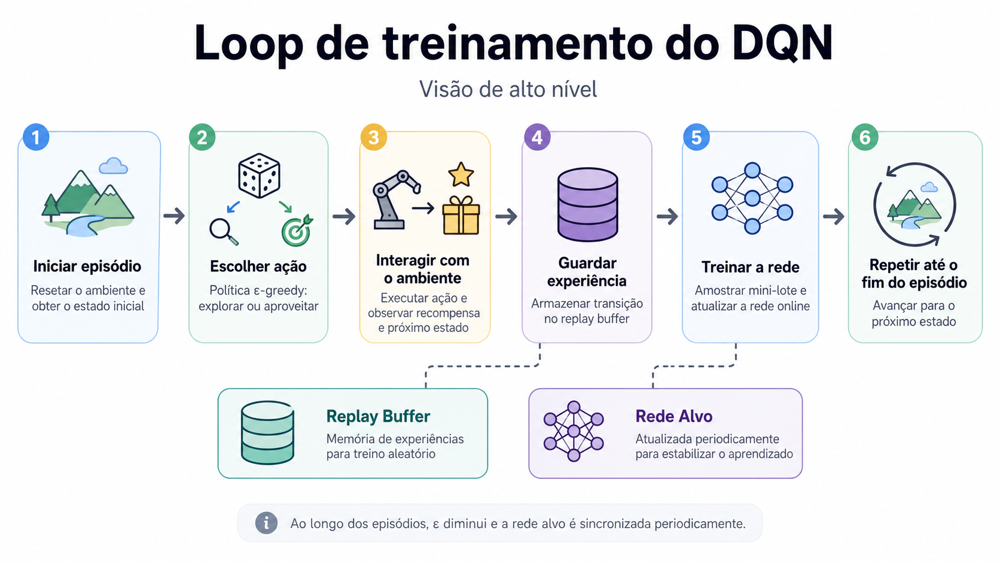

O código abaixo implementa exatamente esses 6 passos.

As primeiras recompensas serão fortemente negativas — o LunarLander penaliza cada passo (−0.3) e colisão (−100).

Isso é esperado enquanto o agente ainda explora aleatoriamente e o buffer está sendo preenchido.

In [10]:
# Verifica se o ambiente LunarLander-v3 está disponível no ambiente de execução.
# Esse ambiente depende do pacote Box2D, que por sua vez pode exigir dependências
# externas do sistema operacional, como o swig.
if not LUNARLANDER_DISPONIVEL:
    # Caso o ambiente não esteja disponível, o treinamento é ignorado.
    # Isso evita que o notebook quebre em máquinas onde o Box2D não foi instalado.
    print("Treinamento ignorado: LunarLander-v3 não disponível.")
    print("Instale swig e gymnasium[box2d] para executar o treinamento completo.")

    # Mesmo sem executar o treinamento, criamos as listas vazias.
    # Isso permite que células posteriores do notebook, como gráficos ou análises,
    # ainda possam ser executadas sem erro de variável inexistente.
    recompensas_ep, perdas_ep, epsilons = [], [], []

else:
    # Lista que armazenará a recompensa total obtida em cada episódio.
    # Cada episódio corresponde a uma tentativa completa do agente no ambiente.
    recompensas_ep = []

    # Lista que armazenará a perda média de treinamento em cada episódio.
    # A perda mede o erro entre o valor Q estimado pela rede e o alvo calculado
    # pela lógica do DQN.
    perdas_ep = []

    # Lista que armazenará o valor de epsilon ao final de cada episódio.
    # Isso permite visualizar como a exploração diminui ao longo do treinamento.
    epsilons = []

    # Inicializa epsilon com o valor definido em EPS_INICIO.
    # Epsilon controla a política ε-greedy:
    # - com probabilidade epsilon, o agente escolhe uma ação aleatória;
    # - com probabilidade 1 - epsilon, escolhe a melhor ação segundo a rede Q.
    epsilon = EPS_INICIO

    # Loop principal de treinamento.
    # Cada iteração representa um episódio completo de interação com o ambiente.
    for episodio in range(1, MAX_EPISODIOS + 1):

        # Reinicia o ambiente no início de cada episódio.
        # O seed é alterado com SEED + episodio para manter reprodutibilidade,
        # mas ainda permitir variação entre episódios.
        estado, _ = env.reset(seed=SEED + episodio)

        # Acumula a recompensa total obtida durante o episódio atual.
        # No LunarLander, recompensas maiores indicam pousos melhores,
        # menor desperdício de combustível e menor instabilidade.
        total = 0.0

        # Armazena as perdas calculadas ao longo dos passos deste episódio.
        # Nem todo passo necessariamente gera uma perda, pois o treinamento
        # pode depender de o replay buffer já ter amostras suficientes.
        perdas = []

        # Loop interno do episódio.
        # Cada passo corresponde a uma interação agente-ambiente:
        # observar estado -> escolher ação -> receber recompensa -> observar próximo estado.
        for passo in range(MAX_PASSOS):

            # Seleciona uma ação usando a política ε-greedy.
            # A rede_online estima os valores Q para cada ação possível.
            # O epsilon define o quanto o agente ainda explora ações aleatórias.
            acao = selecionar_acao(estado, rede_online, epsilon)

            # Executa a ação no ambiente.
            # O ambiente retorna:
            # - prox_estado: observação após a ação;
            # - recompensa: sinal numérico recebido;
            # - terminado: True se o episódio terminou naturalmente;
            # - truncado: True se o episódio foi interrompido por limite de tempo;
            # - _: informações adicionais que não serão usadas aqui.
            prox_estado, recompensa, terminado, truncado, _ = env.step(acao)

            # Um episódio é considerado finalizado se:
            # - o ambiente chegou a um estado terminal natural; ou
            # - o episódio foi truncado por limite de passos.
            feito = terminado or truncado

            # Armazena a transição no replay buffer.
            # Essa transição representa uma experiência do tipo:
            # (estado atual, ação tomada, recompensa recebida, próximo estado, fim do episódio).
            #
            # O DQN não treina apenas com a última transição observada.
            # Ele guarda várias experiências e depois amostra minibatches aleatórios,
            # reduzindo a correlação entre amostras consecutivas.
            buffer.adicionar(estado, acao, recompensa, prox_estado, feito)

            # Executa uma etapa de otimização da rede online.
            # A função otimizar normalmente:
            # - amostra um minibatch do replay buffer;
            # - calcula os valores Q previstos pela rede_online;
            # - calcula os alvos usando recompensa + valor futuro estimado pela rede_alvo;
            # - calcula a função de perda;
            # - faz backpropagation;
            # - atualiza os pesos da rede_online.
            perda = otimizar()

            # Em alguns momentos, otimizar() pode retornar None.
            # Isso geralmente acontece no início do treinamento,
            # quando o replay buffer ainda não tem amostras suficientes
            # para formar um minibatch.
            if perda is not None:
                perdas.append(perda)

            # Atualiza o estado corrente.
            # O próximo estado passa a ser o estado atual do próximo passo.
            estado = prox_estado

            # Acumula a recompensa recebida neste passo.
            # Ao final do episódio, total representará o retorno bruto daquele episódio.
            total += recompensa

            # Se o episódio terminou, interrompemos o loop de passos.
            # Não há motivo para continuar interagindo depois de um pouso,
            # colisão ou truncamento.
            if feito:
                break

        # Atualização periódica da rede alvo.
        #
        # No DQN, usamos duas redes:
        # - rede_online: rede que está sendo treinada a cada otimização;
        # - rede_alvo: rede usada para calcular o alvo de treinamento.
        #
        # A rede alvo é mantida fixa por alguns episódios para reduzir instabilidade.
        # Se usássemos a própria rede_online para prever e também definir o alvo,
        # o alvo mudaria o tempo todo, tornando o treinamento mais instável.
        if episodio % ATUALIZAR_ALVO_A_CADA == 0:
            rede_alvo.load_state_dict(rede_online.state_dict())

        # Decaimento do epsilon.
        #
        # No início do treinamento, epsilon costuma ser alto,
        # incentivando exploração aleatória.
        #
        # Ao longo dos episódios, epsilon diminui,
        # fazendo o agente explorar menos e aproveitar mais o que aprendeu.
        #
        # A função max garante que epsilon nunca fique abaixo de EPS_FIM.
        epsilon = max(EPS_FIM, epsilon * EPS_DECAIMENTO)

        # Registra a recompensa total do episódio.
        # Essa série será usada para analisar a evolução do desempenho do agente.
        recompensas_ep.append(total)

        # Registra a perda média do episódio.
        # Se nenhuma perda foi calculada, salva np.nan para indicar ausência de valor.
        #
        # Isso pode acontecer nos episódios iniciais, antes de haver experiências
        # suficientes no replay buffer.
        perdas_ep.append(np.mean(perdas) if perdas else np.nan)

        # Registra o epsilon após o decaimento.
        # Isso ajuda a visualizar a transição de uma fase mais exploratória
        # para uma fase mais exploratória/exploitativa.
        epsilons.append(epsilon)

        # A cada 10 episódios, imprime um resumo do treinamento.
        # A média dos últimos 10 episódios suaviza a leitura,
        # pois a recompensa de um único episódio pode variar bastante.
        if episodio % 10 == 0:
            media = np.mean(recompensas_ep[-10:])

            # Exibe:
            # - número do episódio;
            # - recompensa média recente;
            # - valor atual de epsilon.
            #
            # O valor de epsilon ajuda a interpretar se o agente ainda está explorando muito
            # ou se já está tomando decisões mais guiadas pela rede Q.
            print(
                f"Episódio {episodio:>3} | "
                f"recompensa média (últimos 10) = {media:8.2f} | "
                f"ε = {epsilon:.3f}"
            )

Episódio  10 | recompensa média (últimos 10) =  -197.29 | ε = 0.776
Episódio  20 | recompensa média (últimos 10) =   -88.41 | ε = 0.603
Episódio  30 | recompensa média (últimos 10) =   -67.44 | ε = 0.468
Episódio  40 | recompensa média (últimos 10) =   -62.05 | ε = 0.363
Episódio  50 | recompensa média (últimos 10) =   -43.10 | ε = 0.282
Episódio  60 | recompensa média (últimos 10) =    -6.53 | ε = 0.219
Episódio  70 | recompensa média (últimos 10) =   -53.18 | ε = 0.170
Episódio  80 | recompensa média (últimos 10) =   -25.15 | ε = 0.132
Episódio  90 | recompensa média (últimos 10) =   -20.36 | ε = 0.102
Episódio 100 | recompensa média (últimos 10) =    -8.44 | ε = 0.080


### Interpretação do progresso de treinamento

**Nota:** nos primeiros ~8 episódios (antes de acumular 500 transições no buffer), a rede **não é otimizada** — o agente apenas coleta experiências. É a partir do MIN_BUFFER que o aprendizado começa de fato. As recompensas de −197 nos episódios 1–10 não indicam "aprendizado ruim", mas "ainda sem aprendizado".

O log de treinamento revela a trajetória de aprendizado do DQN no LunarLander-v3 em três fases:

- **Episódios 1–30 (ε > 0.47):** recompensas muito negativas (−200 a −90). O agente está explorando — a maioria das ações é aleatória, levando a colisões e quedas. O buffer ainda está sendo preenchido com experiências diversas.
- **Episódios 40–60 (ε ≈ 0.22–0.36):** melhora gradual. O buffer contém experiências suficientes para minibatches informativos e a rede começa a aprender padrões básicos de controle — como ativar o motor principal ao se aproximar do solo.
- **Episódios 70–100 (ε < 0.17):** recompensas próximas de 0 a +10. Ainda distante do critério de solução (≥ 200), mas a tendência positiva confirma aprendizado real.

Recompensas negativas no início são normais e esperadas em deep RL. O aprendizado é mais lento do que em métodos tabulares porque a rede neural precisa generalizar a partir de experiências esparsas em um espaço de estado contínuo de 8 dimensões. Treinamentos completos requerem 500–1.000 episódios com hiperparâmetros otimizados.

## Curvas de recompensa, perda e epsilon

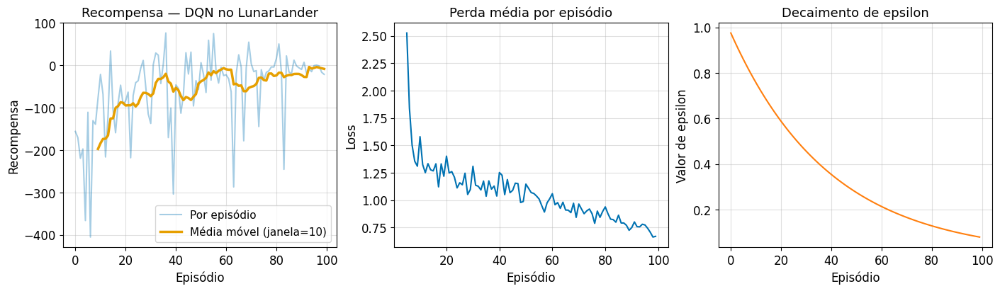

In [11]:
if not LUNARLANDER_DISPONIVEL or len(recompensas_ep) == 0:
    print("Gráficos não disponíveis: dados de treinamento ausentes.")
    print("Instale swig e gymnasium[box2d] para gerar as curvas de aprendizado.")
else:
    def media_movel(x, janela=10):
        if len(x) < janela:
            return np.array(x)
        return np.convolve(np.array(x), np.ones(janela) / janela, mode="valid")

    janela = 10
    ma_recomp = media_movel(recompensas_ep, janela)

    fig, axes = plt.subplots(1, 3, figsize=(14, 4), constrained_layout=True)

    axes[0].plot(recompensas_ep, alpha=0.35, label="Por episódio")
    axes[0].plot(np.arange(len(ma_recomp)) + janela - 1, ma_recomp,
                 linewidth=2.5, label=f"Média móvel (janela={janela})")
    axes[0].set_title("Recompensa — DQN no LunarLander")
    axes[0].set_xlabel("Episódio")
    axes[0].set_ylabel("Recompensa")
    axes[0].legend()

    axes[1].plot(perdas_ep)
    axes[1].set_title("Perda média por episódio")
    axes[1].set_xlabel("Episódio")
    axes[1].set_ylabel("Loss")

    axes[2].plot(epsilons, color="tab:orange")
    axes[2].set_title("Decaimento de epsilon")
    axes[2].set_xlabel("Episódio")
    axes[2].set_ylabel("Valor de epsilon")

    plt.show()

### Interpretação das três curvas



**Curva de recompensa:** 
- a média móvel crescente — de valores fortemente negativos para próximos de zero — indica progresso real do agente.
- As oscilações episódio a episódio são esperadas em deep RL: refletem exploração residual, variabilidade do ambiente e a natureza estocástica do treinamento.

**Curva de loss:**
- a perda oscila em vez de decrescer monotonicamente — comportamento característico de deep RL.
- Quando a rede alvo é sincronizada (a cada 10 episódios), o alvo de Bellman muda abruptamente, causando pico de loss.
- Entre sincronizações, a loss tende a cair enquanto a rede se ajusta ao novo alvo.
- Oscilações controladas indicam treinamento normal, não divergência.

**Curva de epsilon:**
- o decaimento progressivo de ε mostra a transição de exploração pura (ε = 1.0) para explotação crescente (ε → 0.05).
- A melhora de recompensa visível a partir do episódio 70 coincide com ε < 0.17 — quando o agente começa a executar suas decisões aprendidas com maior frequência do que ações aleatórias.

## Bloco 4 — Interpretação pedagógica

O LunarLander exige que o agente coordene múltiplos sinais contínuos. Com apenas 250 episódios, o treinamento está em fase inicial — oscilações e recompensas negativas são normais. O ponto central é a **estrutura** do DQN, não a performance absoluta:

- **Replay buffer** quebra correlações temporais, permitindo que o agente aprenda de experiências diversas simultaneamente.
- **Target network** estabiliza o alvo de atualização, evitando que a rede aprenda contra um alvo que muda a cada passo.
- **Epsilon decrescente** migra o comportamento da exploração pura para a explotação aprendida.

Essas três escolhas de design são respostas diretas aos problemas de instabilidade que surgem ao combinar bootstrapping + off-policy + aproximação por função.

### A tríade mortal do aprendizado por reforço

O DQN combina três ingredientes que, juntos, podem tornar o aprendizado instável:

| Ingrediente | Risco | Como o DQN mitiga |
|---|---|---|
| **Aproximação por função** (rede neural) | Atualizar Q(s,a) altera Q de outros estados — generalização não controlada | Arquitetura conservadora; gradient clipping |
| **Bootstrapping** (alvo usa Q estimado) | Erros se propagam circularmente — estimativas ruins geram alvos ruins | Rede alvo (*target network*) congela o alvo por N episódios |
| **Off-policy** (aprende política ótima com comportamento exploratório) | Distribuição dos dados muda enquanto a política melhora | Replay buffer diversifica a distribuição de treinamento |

Quando esses três ingredientes interagem sem controle, o aprendizado pode **divergir** — os valores Q crescem sem limite ou oscilam indefinidamente. Esse fenômeno é a **tríade mortal** (*deadly triad*, Sutton & Barto, 2018, Cap. 11). O DQN não elimina a tríade, mas **reduz o risco** com as duas salvaguardas principais. Algoritmos posteriores (Double DQN, Dueling DQN, Rainbow) adicionam outras proteções.

## Autoavaliação

<details>
<summary>Pergunta 1: Por que o DQN usa um replay buffer em vez de atualizar a rede a cada transição?</summary>

**Resposta:** Porque transições consecutivas são altamente correlacionadas — o estado s_t+1 depende de s_t. Treinar uma rede neural em sequências correlacionadas é instável: cada atualização desfaz parcialmente as anteriores. O replay buffer armazena transições aleatoriamente e amostra minibatches, quebrando correlação temporal e permitindo que cada transição seja reutilizada múltiplas vezes.

**Por quê:** Redes neurais convergem melhor quando as amostras de treinamento são i.i.d. (independentes e identicamente distribuídas). Transições temporais consecutivas violam essa condição.

</details>

<details>
<summary>Pergunta 2: Qual problema a target network resolve, e como?</summary>

**Resposta:** A target network resolve a instabilidade causada por um alvo de treinamento que muda a cada passo. Sem ela, a rede online estima Q(s,a) e ao mesmo tempo produz o alvo `r + γ·max Q(s',a')` — quando a rede muda, o alvo muda, gerando oscilação. A target network é uma cópia defasada da rede online, atualizada periodicamente, mantendo o alvo estável por vários episódios.

**Por quê:** Treinar para um alvo que muda junto com a rede é análogo a tentar acertar um alvo móvel com cada tiro.

</details>

<details>
<summary>Pergunta 3: O que é a "tríade mortal" e por que o DQN a enfrenta?</summary>

**Resposta:** A tríade mortal (*deadly triad*) é a combinação de três fatores que, juntos, tornam o aprendizado instável: (1) bootstrapping (usar estimativas para calcular alvos), (2) off-policy (aprender sobre política diferente da executada) e (3) aproximação por função (rede neural em vez de tabela). O DQN usa os três — por isso precisa de replay buffer e target network para controlar a instabilidade.

**Por quê:** Cada componente da tríade individualmente é manejável. A combinação dos três cria um ciclo de retroalimentação que pode divergir sem as salvaguardas do DQN.

</details>

## Mapeamento para o Desafio Final

| Competência | Quando usar no Desafio Final |
|---|---|
| Implementar DQN com replay buffer e target network | Qualquer ambiente com estado contínuo e ações discretas |
| Parametrizar CPU/GPU com `rl_utils.obter_dispositivo()` | Sempre que o treinamento for computacionalmente intenso |
| Diagnosticar instabilidade por replay buffer pequeno | Quando a curva de recompensa colapsar ou oscilar excessivamente |
| Distinguir Double DQN, Dueling e PER | Quando DQN padrão atingir um platô e melhorias incrementais forem necessárias |
| Reconhecer a "tríade mortal" | Explicar por que DQN precisa de suas salvaguardas em qualquer ambiente deep RL |

**Regra prática:** use DQN quando o espaço de observação for contínuo e o espaço de ação for discreto com poucos elementos (2–18 ações típicas). Para ações contínuas — torques, velocidades, ângulos — avance para PPO ou SAC (Aula 03).

In [12]:
if not LUNARLANDER_DISPONIVEL or len(recompensas_ep) == 0:
    print("Benchmark ignorado: LunarLander-v3 não disponível.")
else:
    media_final = np.mean(recompensas_ep[-20:])
    limiar_solucao = 200.0
    print("Benchmark — DQN no LunarLander-v3")
    print(f"  Limiar de solução (literatura):      ≥ {limiar_solucao:.0f}")
    print(f"  Obtido aqui (últimos 20 episódios):  {media_final:.1f}")
    print(f"  Distância ao limiar:                 {limiar_solucao - media_final:.1f} pontos")
    print()
    print("Nota: 100 episódios são suficientes para estudar a estrutura do DQN,")
    print("mas insuficientes para atingir o critério de solução. Treinamentos")
    print("completos requerem 500–1000 episódios com hiperparâmetros otimizados.")

Benchmark — DQN no LunarLander-v3
  Limiar de solução (literatura):      ≥ 200
  Obtido aqui (últimos 20 episódios):  -14.4
  Distância ao limiar:                 214.4 pontos

Nota: 100 episódios são suficientes para estudar a estrutura do DQN,
mas insuficientes para atingir o critério de solução. Treinamentos
completos requerem 500–1000 episódios com hiperparâmetros otimizados.


## Benchmark — DQN no LunarLander-v3


O LunarLander-v3 é considerado **resolvido** quando o agente obtém recompensa média ≥ 200 ao longo de 100 episódios consecutivos (critério Farama Foundation).

Com 100 episódios didáticos (configuração deste notebook), o agente está em fase inicial — esperamos recompensas entre −200 e +50.

Treinamentos de produção com DQN padrão atingem o limiar de 200 em ~500–1.000 episódios (Mnih et al., 2015).

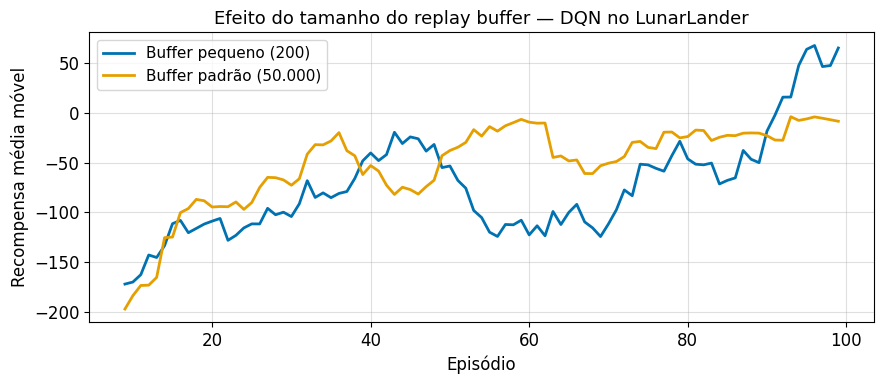

Buffer pequeno (últ. 20 ep): 7.6
Buffer padrão  (últ. 20 ep): -14.4


In [13]:
if not LUNARLANDER_DISPONIVEL:
    print("Experimento D3 ignorado: LunarLander-v3 não disponível.")
else:
    def treinar_dqn_d3(capacidade_buffer, episodios=100, max_passos=400):
        rede_d3 = RedeQ(dim_estado, dim_acoes).to(dispositivo)
        rede_alvo_d3 = RedeQ(dim_estado, dim_acoes).to(dispositivo)
        rede_alvo_d3.load_state_dict(rede_d3.state_dict())
        buf_d3 = ReplayBuffer(capacidade=capacidade_buffer)
        opt_d3 = optim.Adam(rede_d3.parameters(), lr=1e-3)
        eps_d3 = 1.0
        log_d3 = []
        for ep in range(1, episodios + 1):
            estado, _ = env.reset(seed=SEED + ep)
            total = 0.0
            for _ in range(max_passos):
                acao = selecionar_acao(estado, rede_d3, eps_d3)
                prox, r, term, trunc, _ = env.step(acao)
                feito = term or trunc
                buf_d3.adicionar(estado, acao, r, prox, feito)
                if len(buf_d3) >= min(64, capacidade_buffer):
                    trans = buf_d3.amostrar(min(64, len(buf_d3)))
                    s_t = torch.tensor(np.array(trans.estado), dtype=torch.float32, device=dispositivo)
                    a_t = torch.tensor(trans.acao, dtype=torch.int64, device=dispositivo).unsqueeze(1)
                    r_t = torch.tensor(trans.recompensa, dtype=torch.float32, device=dispositivo).unsqueeze(1)
                    sp_t = torch.tensor(np.array(trans.prox_estado), dtype=torch.float32, device=dispositivo)
                    f_t = torch.tensor(trans.feito, dtype=torch.float32, device=dispositivo).unsqueeze(1)
                    q_vals = rede_d3(s_t).gather(1, a_t)
                    with torch.no_grad():
                        q_prox = rede_alvo_d3(sp_t).max(1, keepdim=True).values
                        alvos = r_t + GAMMA * q_prox * (1 - f_t)
                    loss = funcao_perda(q_vals, alvos)
                    opt_d3.zero_grad(); loss.backward()
                    nn.utils.clip_grad_norm_(rede_d3.parameters(), 10.0)
                    opt_d3.step()
                estado = prox; total += r
                if feito: break
            if ep % ATUALIZAR_ALVO_A_CADA == 0:
                rede_alvo_d3.load_state_dict(rede_d3.state_dict())
            eps_d3 = max(EPS_FIM, eps_d3 * EPS_DECAIMENTO)
            log_d3.append(total)
        return np.array(log_d3)

    log_pequeno = treinar_dqn_d3(capacidade_buffer=200)
    log_padrao = recompensas_ep  # já treinado com buffer=50000

    janela_d4 = 10
    plt.figure(figsize=(9, 4))
    for log, label in [(log_pequeno, "Buffer pequeno (200)"), (log_padrao, "Buffer padrão (50.000)")]:
        ma = media_movel(log, janela_d4)
        plt.plot(np.arange(len(ma)) + janela_d4 - 1, ma, label=label, linewidth=2)
    plt.title('Efeito do tamanho do replay buffer — DQN no LunarLander')
    plt.xlabel('Episódio')
    plt.ylabel('Recompensa média móvel')
    plt.legend()
    plt.tight_layout()
    plt.show()
    print(f"Buffer pequeno (últ. 20 ep): {log_pequeno[-20:].mean():.1f}")
    print(f"Buffer padrão  (últ. 20 ep): {np.array(log_padrao)[-20:].mean():.1f}")

### Interpretação do experimento com replay buffer

O experimento quantifica o impacto direto do tamanho do buffer na qualidade do aprendizado:

- **Buffer pequeno (capacidade 200):** o agente treina repetidamente nas mesmas ~200 transições mais recentes. Experiências antigas são descartadas antes de contribuírem para a generalização. O resultado é **esquecimento catastrófico** — a rede ajusta pesos para padrões recentes e desfaz o que aprendeu antes. A recompensa final tende a ser inferior ou instável.

- **Buffer padrão (capacidade 50.000):** o buffer mantém uma coleção diversificada de experiências de diferentes fases do treinamento. A amostragem aleatória garante que cada minibatch contenha transições variadas, estabilizando o aprendizado e permitindo que a rede generalize entre diferentes regiões do espaço de estado.

A diferença de recompensa final entre os dois cenários é consequência direta dessa diversidade. Um buffer grande não é apenas uma questão de memória — é o mecanismo que quebra a correlação temporal e torna o treinamento com redes neurais viável em deep RL.

## ⚠️ O que pode dar errado: replay buffer muito pequeno

Com buffer muito pequeno, o agente treina repetidamente nas mesmas transições recentes — equivalente a não ter buffer nenhum. A rede "esquece" experiências antigas (*catastrophic forgetting*) e pode colapsar em políticas ruins. O experimento abaixo compara o DQN com buffer de capacidade 200 (minúsculo) vs 50.000 (padrão).

## Melhorias conceituais do DQN

**Double DQN** reduz viés de superestimação. A ideia: usar a rede online para *selecionar* a melhor ação no próximo estado, mas a rede alvo para *avaliar* o valor dessa ação. Isso desacopla seleção e avaliação, reduzindo estimativas otimistas excessivas.

**Dueling Network** reorganiza a arquitetura em dois ramos:
- Um ramo estima V(s) — quão bom é o estado
- Outro estima A(s,a) = Q(s,a) − V(s) — a vantagem relativa de cada ação

O resultado: Q(s,a) = V(s) + A(s,a) − média(A). Isso permite ao agente aprender que certos estados são intrinsecamente bons independentemente da ação escolhida.

**Prioritized Experience Replay (PER)** substitui amostragem uniforme do replay buffer por amostragem ponderada pelo erro temporal: transições com maior erro têm maior chance de ser revisitadas. Experiências mais informativas são reutilizadas com maior frequência.

## Bloco 5 — Limitações dos métodos value-based (seção 2.9)

Os métodos value-based — desde a tabela Q até o DQN — compartilham uma limitação estrutural: **o espaço de ações deve ser discreto e pequeno**. A operação `max_a Q(s,a)` pressupõe que é possível enumerar todas as ações possíveis.

Quando as ações são **contínuas** (como torque de um motor, ângulo de direção, força aplicada), essa maximização deixa de ser trivial e pode se tornar impraticável.

Outras limitações relevantes:

- **Sensibilidade a hiperparâmetros:** taxa de aprendizado, tamanho do buffer, frequência de atualização da rede alvo e esquema de epsilon impactam significativamente a convergência.
- **Instabilidade inerente:** a combinação de bootstrapping + off-policy + aproximação por função cria um triângulo de instabilidade que os mecanismos do DQN só atenuam, sem eliminar.
- **Custo computacional crescente:** em ambientes mais ricos, o número de transições necessárias para aprendizado estável cresce rapidamente.

Esse conjunto de dificuldades motiva a próxima família de métodos, apresentada na Aula 03: os **Policy-Based Methods** (REINFORCE, Actor-Critic, PPO), que otimizam diretamente a política — especialmente úteis quando o espaço de ações é contínuo.

## Principais aprendizados

1. **DQN substitui a tabela Q por uma rede neural**, permitindo generalização entre estados similares em espaços contínuos ou de alta dimensionalidade.
2. **Replay buffer** armazena transições passadas e treina em mini-lotes amostrados aleatoriamente — quebrando correlação temporal e evitando *catastrophic forgetting*.
3. **Rede alvo (*target network*)** mantém pesos fixos por vários episódios, estabilizando o alvo de atualização e evitando o problema do "alvo em movimento".
4. **A tríade mortal** (bootstrapping + off-policy + aproximação por função) cria instabilidade inerente — replay buffer e target network atenuam, mas não eliminam esse risco.
5. O **treinamento oscila mais do que em métodos tabulares**: loss não monotônica e recompensas ruidosas são comportamento normal em deep RL, não sinal de bug.

## Glossário — termos introduzidos neste notebook

| Termo (EN) | Tradução (PT) | Descrição |
|---|---|---|
| DQN | DQN | Deep Q-Network — aproxima Q(s,a) com rede neural; usa replay buffer e target network. |
| replay buffer | buffer de replay | Memória que armazena transições `(s,a,r,s',done)` para treinamento em mini-batches. |
| target network | rede-alvo | Cópia estável da rede principal usada para calcular alvos de treinamento de forma estável. |
| Double DQN | Double DQN | Melhoria que separa seleção de ação (rede online) e avaliação (rede alvo) para reduzir viés. |
| function approximation | aproximação por função | Uso de uma função parametrizada (rede neural) para representar Q(s,a) em espaços contínuos. |

> Glossário completo do curso: [docs/glossario.md](../../docs/glossario.md)

## Leituras e referências

- Mnih, V. et al. (2015). Human-level control through deep reinforcement learning. *Nature*, 518, 529–533.
- Van Hasselt, H., Guez, A., & Silver, D. (2016). Deep reinforcement learning with double Q-learning. *AAAI*, 30(1).
- Wang, Z. et al. (2016). Dueling network architectures for deep reinforcement learning. *ICML*.
- Schaul, T. et al. (2016). Prioritized experience replay. *ICLR*.
- Sutton, R. S., & Barto, A. G. (2018). *Reinforcement Learning: An Introduction* (2ª ed.). MIT Press. Cap. 9 (Aproximação por função). Disponível em: http://incompleteideas.net/book/the-book-2nd.html. Acesso em: abril 2026.